In [1]:
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os

In [2]:
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import cross_val_score

Preprocessing

Here made two lists and then using for loops appeded images which are now change into arrays of numbers and their labels.

Function relpath was used for taking the relative paths of both folder directly from the main folder.

In [3]:
lst = ["with_mask","without_mask"]

In [4]:
data = []
labels = []

In [5]:
for clas in lst:
    path = os.path.relpath(clas)

    for img in os.listdir(path):
    	imgage_path = os.path.join(path, img)

    	image = load_img(imgage_path, target_size=(224, 224))
    	image = img_to_array(image)
    	image = preprocess_input(image)
    	data.append(image)
    	labels.append(clas)
		


C:\Users\Ajay\AppData\Local\Programs\Python\Python39\lib\site-packages\PIL\Image.py:962: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [6]:
test_data = []
test_labels = []

In [7]:
lst_test  = ["MASK_TEST",'NO_MASK_TEST']

In [8]:
for clas in lst_test:
    path = os.path.relpath(clas)

    for img in os.listdir(path):
    	imgage_path = os.path.join(path, img)

    	image = load_img(imgage_path, target_size=(224, 224))
    	image = img_to_array(image)
    	image = preprocess_input(image)
    	test_data.append(image)
    	test_labels.append(clas)

In [9]:
print(len(test_data))

255


Encoding using label encoder.

In [12]:
lb = LabelEncoder()
labels = lb.fit_transform(labels)
print(labels)

[0 0 0 ... 1 1 1]


In [13]:
test_labels = lb.fit_transform(test_labels)
print(test_labels)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]


In [14]:
cou1= 0
cou2 = 0

for i in test_labels:
    if  i == 0:
        cou1 += 1
    
    else:
        cou2 += 1
print('Number of masked images : ',cou1)
print('Number of image with no mask :  ',cou2)

Number of masked images :  55
Number of image with no mask :   200


Changing these into numpy arrays as machine learning models only take them as inputs.

In [15]:
# excution time = around 10 - 20 seconds

data = np.array(data, dtype="float32")
lables = np.array(labels)

In [16]:
test_data = np.array(test_data,dtype="float32")
test_labels = np.array(test_labels)

In [20]:
print(test_data.shape)

(255, 224, 224, 3)


Reshaping/ flattening the array of shape (3833,224,224,3) into an array of shape (3833,15058)

In [21]:
arr1 = data.reshape(3833,150528)
#print(arr1)

In [22]:
arr2 = test_data.reshape(255,150528)

Making a dataframe for doing further process easily.

In [23]:
dataframe = pd.DataFrame(arr1)

In [24]:
dataframe.head()

,0,1,2,3,4,5,6,7,8,9,...,150518,150519,150520,150521,150522,150523,150524,150525,150526,150527
0,-0.450980,-0.490196,-0.443137,-0.450980,-0.490196,-0.443137,-0.450980,-0.490196,-0.443137,-0.396078,...,-0.654902,-0.341176,-0.545098,-0.647059,-0.341176,-0.545098,-0.647059,-0.341176,-0.545098,-0.647059
1,0.325490,0.301961,0.247059,0.325490,0.301961,0.247059,0.349020,0.325490,0.270588,0.349020,...,0.105882,0.098039,0.058824,0.105882,0.113726,0.074510,0.121569,0.113726,0.074510,0.121569
2,-0.411765,-0.403922,-0.388235,-0.411765,-0.403922,-0.388235,-0.521569,-0.513726,-0.498039,-0.521569,...,-0.662745,-0.725490,-0.725490,-0.662745,-0.749020,-0.749020,-0.686275,-0.749020,-0.749020,-0.686275
3,-0.929412,-0.945098,-0.921569,-0.929412,-0.945098,-0.921569,-0.921569,-0.937255,-0.913725,-0.945098,...,-0.913725,-0.976471,-0.976471,-0.913725,-0.976471,-0.976471,-0.898039,-0.976471,-0.976471,-0.898039
4,-0.654902,-0.615686,-0.584314,-0.654902,-0.615686,-0.584314,-0.662745,-0.623529,-0.592157,-0.662745,...,0.952941,0.913725,0.945098,0.937255,0.913725,0.945098,0.937255,0.913725,0.945098,0.937255


In [25]:
dataframe['labels'] = labels
dataframe

,0,1,2,3,4,5,6,7,8,9,...,150519,150520,150521,150522,150523,150524,150525,150526,150527,labels
0,-0.450980,-0.490196,-0.443137,-0.450980,-0.490196,-0.443137,-0.450980,-0.490196,-0.443137,-0.396078,...,-0.341176,-0.545098,-0.647059,-0.341176,-0.545098,-0.647059,-0.341176,-0.545098,-0.647059,0
1,0.325490,0.301961,0.247059,0.325490,0.301961,0.247059,0.349020,0.325490,0.270588,0.349020,...,0.098039,0.058824,0.105882,0.113726,0.074510,0.121569,0.113726,0.074510,0.121569,0
2,-0.411765,-0.403922,-0.388235,-0.411765,-0.403922,-0.388235,-0.521569,-0.513726,-0.498039,-0.521569,...,-0.725490,-0.725490,-0.662745,-0.749020,-0.749020,-0.686275,-0.749020,-0.749020,-0.686275,0
3,-0.929412,-0.945098,-0.921569,-0.929412,-0.945098,-0.921569,-0.921569,-0.937255,-0.913725,-0.945098,...,-0.976471,-0.976471,-0.913725,-0.976471,-0.976471,-0.898039,-0.976471,-0.976471,-0.898039,0
4,-0.654902,-0.615686,-0.584314,-0.654902,-0.615686,-0.584314,-0.662745,-0.623529,-0.592157,-0.662745,...,0.913725,0.945098,0.937255,0.913725,0.945098,0.937255,0.913725,0.945098,0.937255,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3828,0.858824,0.882353,0.796078,1.000000,1.000000,0.945098,0.819608,0.827451,0.764706,0.960784,...,0.105882,0.129412,-0.113725,0.239216,0.301961,0.011765,0.262745,0.364706,0.019608,1
3829,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,1
3830,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,1
3831,0.670588,0.678431,0.709804,0.835294,0.843137,0.874510,0.654902,0.654902,0.670588,0.968627,...,-0.058824,-0.050980,-0.011765,0.607843,0.600000,0.741176,0.866667,0.835294,0.968627,1


In [26]:
test_dataframe  = pd.DataFrame(arr2)

In [27]:
test_dataframe['Class'] = test_labels

In [28]:
test_dataframe

,0,1,2,3,4,5,6,7,8,9,...,150519,150520,150521,150522,150523,150524,150525,150526,150527,Class
0,-0.976471,-0.976471,-0.960784,-0.976471,-0.976471,-0.960784,-0.968627,-0.984314,-0.960784,-0.960784,...,0.490196,0.733333,0.898039,0.490196,0.733333,0.898039,0.490196,0.733333,0.898039,0
1,-0.662745,-0.701961,-0.647059,-0.662745,-0.701961,-0.647059,-0.654902,-0.678431,-0.623529,-0.521569,...,-0.701961,-0.772549,-0.811765,-0.709804,-0.733333,-0.772549,-0.709804,-0.733333,-0.772549,0
2,-0.521569,-0.513726,-0.498039,-0.286274,-0.286274,-0.270588,-0.380392,-0.380392,-0.364706,-0.443137,...,-0.960784,-0.952941,-0.913725,-0.968627,-0.960784,-0.921569,-0.952941,-0.945098,-0.905882,0
3,-0.066667,-0.082353,0.003922,-0.074510,-0.090196,-0.003922,-0.074510,-0.090196,-0.003922,-0.239216,...,-0.247059,-0.372549,-0.349020,-0.247059,-0.372549,-0.349020,-0.341176,-0.458824,-0.419608,0
4,-0.788235,-0.827451,-0.780392,-0.686275,-0.725490,-0.678431,-0.662745,-0.701961,-0.647059,-0.662745,...,-0.498039,-0.678431,-0.725490,-0.505882,-0.662745,-0.717647,-0.474510,-0.639216,-0.662745,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
250,-0.662745,0.082353,0.137255,-0.662745,0.082353,0.137255,-0.662745,0.082353,0.137255,-0.600000,...,-0.945098,-0.913725,-0.874510,-0.882353,-0.874510,-0.850980,-0.960784,-0.960784,-0.968627,1
251,-0.717647,-0.717647,-0.717647,-0.717647,-0.717647,-0.717647,-0.717647,-0.717647,-0.717647,-0.717647,...,-0.898039,-0.898039,-0.898039,-0.905882,-0.905882,-0.905882,-0.905882,-0.905882,-0.905882,1
252,-0.262745,-0.239216,0.176471,-0.254902,-0.231373,0.184314,-0.247059,-0.223529,0.192157,-0.231373,...,0.066667,-0.066667,-0.003922,0.050980,-0.082353,-0.019608,0.066667,-0.066667,-0.003922,1
253,0.137255,0.137255,0.152941,0.137255,0.137255,0.152941,0.137255,0.137255,0.152941,0.137255,...,-0.607843,-0.607843,-0.623529,-0.615686,-0.600000,-0.623529,-0.615686,-0.615686,-0.631373,1


In [29]:
x = dataframe.drop(['labels'],axis=1)
y = dataframe[['labels']]

In [30]:
testx = test_dataframe.drop(['Class'],axis=1)
testy = test_dataframe[['Class']]

Train test split

In [31]:
X_train,X_test,Y_train,Y_test = train_test_split(x,y,test_size=0.5,random_state=1)

In [32]:
X_train.shape,Y_train.shape,X_test.shape

((1916, 150528), (1916, 1), (1917, 150528))

Model fitting

Models used - 
                MLPClassifier
                RandomForestClassifier
                GaussianNB

Then calculated their accuracy and classification reports.

Multi layer perceptron - best classfier but high fitting time

In [33]:
mlp = MLPClassifier()

In [34]:
%%time

mlp.fit(X_train,np.ravel(Y_train))

Wall time: 6min 7s


MLPClassifier()

In [35]:
pred = mlp.predict(testx)

In [36]:
pred_og = mlp.predict(X_test)

In [37]:
from sklearn.metrics import accuracy_score

In [38]:
print(accuracy_score(Y_test,pred_og))

0.9238393322900366


In [39]:
print(accuracy_score(testy,pred))

0.9019607843137255


In [40]:
print(classification_report(Y_test,pred_og))

              precision    recall  f1-score   support

           0       0.94      0.91      0.92       973
           1       0.91      0.94      0.92       944

    accuracy                           0.92      1917
   macro avg       0.92      0.92      0.92      1917
weighted avg       0.92      0.92      0.92      1917



In [70]:
wrong_class_mlp = []

for i in range(255):
    if pred[i] != test_labels[i]:
        wrong_class_mlp.append(i)

In [71]:
print(wrong_class_mlp)

[4, 8, 13, 22, 34, 43, 44, 46, 50, 91, 139, 154, 168, 183, 185, 218, 222, 224, 236, 239, 242, 243, 244, 251, 253]


In [72]:
print(len(wrong_class_mlp))

25


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

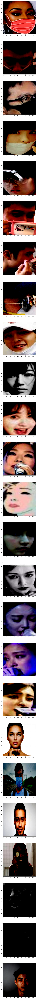

In [73]:
fig, axi2 = plt.subplots(len(wrong_class_mlp),1,figsize=(400,200))

axi2[0].imshow(test_data[4])
axi2[1].imshow(test_data[8])
axi2[2].imshow(test_data[13])
axi2[3].imshow(test_data[22])
axi2[4].imshow(test_data[34])
axi2[5].imshow(test_data[43])
axi2[6].imshow(test_data[44])
axi2[7].imshow(test_data[46])
axi2[8].imshow(test_data[50])
axi2[9].imshow(test_data[91])
axi2[10].imshow(test_data[139])
axi2[11].imshow(test_data[154])
axi2[12].imshow(test_data[168])
axi2[13].imshow(test_data[183])
axi2[14].imshow(test_data[185])
axi2[15].imshow(test_data[218])
axi2[16].imshow(test_data[222])
axi2[17].imshow(test_data[224])
axi2[18].imshow(test_data[236])
axi2[19].imshow(test_data[239])
axi2[20].imshow(test_data[242])
axi2[21].imshow(test_data[243])
axi2[22].imshow(test_data[244])
axi2[23].imshow(test_data[251])
axi2[24].imshow(test_data[253])


Random forest - second best classifier

In [41]:
%%time
rf = RandomForestClassifier(n_estimators=100,n_jobs=-1)
rf.fit(X_train,np.ravel(Y_train))

Wall time: 8.97 s


RandomForestClassifier(n_jobs=-1)

In [42]:
rf_predict_og = rf.predict(X_test)

In [43]:
rf_predict_test = rf.predict(testx)

In [44]:
print(accuracy_score(Y_test,rf_predict_og))

0.9300991131977048


In [45]:
print(accuracy_score(testy,rf_predict_test))

0.8549019607843137


In [50]:
print(classification_report(Y_test,rf_predict_og))

              precision    recall  f1-score   support

           0       0.92      0.95      0.93       973
           1       0.95      0.91      0.93       944

    accuracy                           0.93      1917
   macro avg       0.93      0.93      0.93      1917
weighted avg       0.93      0.93      0.93      1917



In [80]:
wrong_class_rf = []

for i in range(255):
    if rf_predict_test[i] != test_labels[i]:
        wrong_class_rf.append(i)

In [81]:
print(len(wrong_class_rf))

37


In [49]:
print(wrong_class_rf)

[4, 8, 34, 44, 46, 50, 52, 72, 76, 91, 105, 114, 116, 122, 124, 143, 147, 148, 154, 159, 168, 173, 182, 183, 184, 197, 206, 207, 218, 222, 236, 239, 242, 243, 244, 251, 254]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

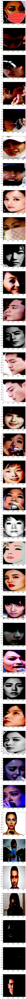

In [66]:
fig, ax1 = plt.subplots(len(wrong_class_rf),1,figsize=(400,200))

ax1[0].imshow(test_data[4])
ax1[1].imshow(test_data[8])
ax1[2].imshow(test_data[34])
ax1[3].imshow(test_data[44])
ax1[4].imshow(test_data[46])
ax1[5].imshow(test_data[50])
ax1[6].imshow(test_data[52])
ax1[7].imshow(test_data[72])
ax1[8].imshow(test_data[76])
ax1[9].imshow(test_data[91])
ax1[10].imshow(test_data[105])
ax1[11].imshow(test_data[114])
ax1[12].imshow(test_data[116])
ax1[13].imshow(test_data[122])
ax1[14].imshow(test_data[124])
ax1[15].imshow(test_data[143])
ax1[16].imshow(test_data[147])
ax1[17].imshow(test_data[148])
ax1[18].imshow(test_data[154])
ax1[19].imshow(test_data[159])
ax1[20].imshow(test_data[168])
ax1[21].imshow(test_data[173])
ax1[22].imshow(test_data[182])
ax1[23].imshow(test_data[183])
ax1[24].imshow(test_data[184])
ax1[25].imshow(test_data[197])
ax1[26].imshow(test_data[206])
ax1[27].imshow(test_data[207])
ax1[28].imshow(test_data[218])
ax1[29].imshow(test_data[222])
ax1[30].imshow(test_data[236])
ax1[31].imshow(test_data[239])
ax1[32].imshow(test_data[242])
ax1[33].imshow(test_data[243])
ax1[34].imshow(test_data[244])
ax1[35].imshow(test_data[251])
ax1[36].imshow(test_data[254])
#ax1[37].imshow(test_data[1])

Gaussian Naibe Bayes - worst out of three

In [51]:
gauss = GaussianNB()

In [52]:
%%time
gauss.fit(X_train,np.ravel(Y_train))

Wall time: 4.45 s


GaussianNB()

In [53]:
accuracy_gauss = cross_val_score(gauss,X_train,np.ravel(Y_train),scoring='accuracy',cv=10)

In [54]:
print(accuracy_gauss.mean())

0.810544829842932


In [55]:
print(accuracy_gauss)

[0.765625   0.859375   0.78645833 0.81770833 0.828125   0.80208333
 0.85340314 0.76963351 0.79581152 0.82722513]


In [56]:
pred_gauss = gauss.predict(X_test)

In [57]:
print(accuracy_score(Y_test,pred_gauss))

0.810641627543036


In [58]:
pred_gauss_test = gauss.predict(testx)
print(accuracy_score(testy,pred_gauss_test))

0.8156862745098039


In [59]:
print(classification_report(Y_test,pred_gauss))

              precision    recall  f1-score   support

           0       0.81      0.82      0.82       973
           1       0.81      0.80      0.81       944

    accuracy                           0.81      1917
   macro avg       0.81      0.81      0.81      1917
weighted avg       0.81      0.81      0.81      1917



In [76]:
print(pred_gauss_test)

[0 0 0 0 1 0 1 0 0 0 0 0 1 1 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 1 1 0 0 1 0 1
 0 1 0 1 0 0 1 1 0 1 1 1 1 1 0 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 0 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0]


In [77]:
wrong_class_gauss = []

for i in range(255):
    if pred_gauss_test[i] != test_labels[i]:
        wrong_class_gauss.append(i)

In [78]:
print(wrong_class_gauss)

[4, 6, 12, 13, 18, 22, 27, 30, 31, 34, 36, 38, 40, 43, 44, 46, 47, 48, 49, 50, 52, 72, 91, 122, 124, 159, 168, 184, 207, 222, 235, 236, 237, 238, 239, 241, 242, 243, 244, 245, 246, 247, 248, 250, 251, 252, 254]


In [82]:
print(wrong_class_rf)

[4, 8, 34, 44, 46, 50, 52, 72, 76, 91, 105, 114, 116, 122, 124, 143, 147, 148, 154, 159, 168, 173, 182, 183, 184, 197, 206, 207, 218, 222, 236, 239, 242, 243, 244, 251, 254]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

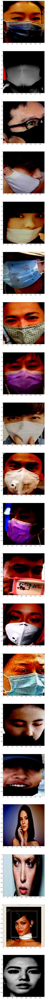

In [84]:
fig, ax3 = plt.subplots(20,1,figsize=(400,200))

ax3[0].imshow(test_data[6])
ax3[1].imshow(test_data[12])
ax3[2].imshow(test_data[13])
ax3[3].imshow(test_data[18])
ax3[4].imshow(test_data[22])
ax3[5].imshow(test_data[27])
ax3[6].imshow(test_data[30])
ax3[7].imshow(test_data[31])
ax3[8].imshow(test_data[36])
ax3[9].imshow(test_data[38])
ax3[10].imshow(test_data[40])
ax3[11].imshow(test_data[43])
ax3[12].imshow(test_data[47])
ax3[13].imshow(test_data[48])
ax3[14].imshow(test_data[49])
ax3[15].imshow(test_data[52])
ax3[16].imshow(test_data[252])
ax3[17].imshow(test_data[241])
ax3[18].imshow(test_data[235])
ax3[19].imshow(test_data[197])

#DONE